# Sections 4.1 & 4.2: Emulator Selection and Uncertainty Quantification

This notebook implements the complete analysis pipeline for:
- **Section 4.1**: Emulator selection via point estimation accuracy with statistical testing
- **Section 4.2**: Uncertainty quantification and parameter identifiability for the three candidate models

**Parameter naming convention**: The 10 H-O constitutive parameters are denoted  
$C_{a,1}, C_{b,1}, C_{a,2}, C_{b,2}, C_{a,3}, C_{b,3}, C_{a,4}, C_{b,4}, C_{a,5}, C_{b,5}$.

## 0. Setup and Data Loading

In [1]:
import numpy as np
import pandas as pd
import ast, os, pickle, warnings
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import seaborn as sns
import torch
from scipy import stats
from scipy.stats import gaussian_kde, wilcoxon
from itertools import combinations

# Pyro diagnostics
from pyro.ops.stats import gelman_rubin, split_gelman_rubin, effective_sample_size

warnings.filterwarnings('ignore')
plt.style.use('seaborn-v0_8-whitegrid')
plt.rcParams.update({'font.size': 11, 'axes.titlesize': 13, 'figure.dpi': 120})

PARAM_LABELS = [r'$C_{a,1}$', r'$C_{b,1}$', r'$C_{a,2}$', r'$C_{b,2}$', r'$C_{a,3}$',
                r'$C_{b,3}$', r'$C_{a,4}$', r'$C_{b,4}$', r'$C_{a,5}$', r'$C_{b,5}$']
PARAM_LABELS_PLAIN = ['Ca1','Cb1','Ca2','Cb2','Ca3','Cb3','Ca4','Cb4','Ca5','Cb5']
N_PARAMS = 10

# ── Canonical model ordering ──
MODEL_ORDER = ['L.GP', 'L.MGP', 'L.DKGP', 'L.DKMGP', 'VGP', 'MVGP', 'DGP', 'DNN']

print('Setup complete.')

Setup complete.


In [2]:
# ── Helper ──
def extract_data(csv_path, col_name='estimated_params'):
    df = pd.read_csv(csv_path)
    return np.array(df[col_name].apply(ast.literal_eval).tolist())

# ── Ground truth ──
X_train = pd.read_csv('Data/X_train.csv', header=None).values
X_test  = pd.read_csv('Data/X_test.csv',  header=None).values
Y_train_21 = pd.read_csv('Data/Y_train_std_21.csv', header=None).values
Y_test_21  = pd.read_csv('Data/Y_test_std_21.csv',  header=None).values
Y_train_std = pd.read_csv('Data/Y_train_std.csv', header=None).values
Y_test_std  = pd.read_csv('Data/Y_test_std.csv',  header=None).values

N_TEST = X_test.shape[0]
print(f'Training set: {X_train.shape[0]} samples, {X_train.shape[1]} params')
print(f'Test set:     {N_TEST} samples, {X_test.shape[1]} params')
print(f'Output dim (PCA):  {Y_test_21.shape[1]}')
print(f'Output dim (full): {Y_test_std.shape[1]}')

Training set: 4539 samples, 10 params
Test set:     120 samples, 10 params
Output dim (PCA):  21
Output dim (full): 52


In [3]:
# ── Point estimation results for all 8 models ──
base_dir = 'PlotData'
model_files = {
    'L.GP':    'L.GP_21_result.csv',
    'L.MGP':   'L.MGP_21_result.csv',
    'L.DKGP':  'L.DKGP_21_result.csv',
    'L.DKMGP': 'L.DKMGP_21_result.csv',
    'VGP':     'VGP_21_result.csv',
    'MVGP':    'MVGP_21_result.csv',
    'DGP':     'DGP_21_point_result.csv',
    'DNN':     'DNN_21_result.csv',
}

# Load estimated parameters and output predictions
est_params = {}   # estimated X
est_preds  = {}   # predicted Y (PCA space)
for name in MODEL_ORDER:
    fn = model_files[name]
    path = os.path.join(base_dir, fn)
    est_params[name] = extract_data(path, 'estimated_params')
    est_preds[name]  = extract_data(path, 'test_preds')

print('All 8 model results loaded.')
for k in MODEL_ORDER:
    print(f'  {k:10s}: est_params {est_params[k].shape}, est_preds {est_preds[k].shape}')

All 8 model results loaded.
  L.GP      : est_params (120, 10), est_preds (120, 21)
  L.MGP     : est_params (120, 10), est_preds (120, 21)
  L.DKGP    : est_params (120, 10), est_preds (120, 21)
  L.DKMGP   : est_params (120, 10), est_preds (120, 21)
  VGP       : est_params (120, 10), est_preds (120, 21)
  MVGP      : est_params (120, 10), est_preds (120, 21)
  DGP       : est_params (120, 10), est_preds (120, 21)
  DNN       : est_params (120, 10), est_preds (120, 21)


---
# Section 4.1: Emulator Selection

## 4.1.1 Experimental Protocol

**Training data**: $N_{\text{train}}$ parameter vectors sampled via Sobol sequence to ensure 
quasi-uniform coverage of the 10-dimensional H-O parameter space. Each parameter vector is 
passed through the left-ventricle mechanics simulator based on the Holzapfel-Ogden constitutive 
law, yielding high-dimensional displacement/strain outputs. These outputs are standardised 
($Y_{\text{std}}$) and then reduced to 21 principal components ($Y_{21}$) explaining >99% of 
the total variance.

**Test data**: A held-out set of $N_{\text{test}}$ parameter vectors (also Sobol-sampled) serves 
as the evaluation benchmark. All models are compared on identical test points.

**Models compared**: 8 emulators spanning single-output (L.GP, L.DKGP, VGP, DGP) and 
multi-output (L.MGP, L.DKMGP, MVGP, DNN) strategies.

## 4.1.2 Point Estimation Accuracy

### 4.1.2a Per-sample MSE in parameter space — summary table (bold = top 3)

In [4]:
# ── Per-sample MSE (in parameter space): shape (N_TEST,) per model ──
mse_per_sample = {}
for name in MODEL_ORDER:
    mse_per_sample[name] = np.mean((est_params[name] - X_test)**2, axis=1)

# ── Per-parameter squared error ──
mse_per_param = {}  # {model: (N_TEST, N_PARAMS)}
for name in MODEL_ORDER:
    mse_per_param[name] = (est_params[name] - X_test)**2

# ── Summary table in canonical order ──
summary_rows = []
for name in MODEL_ORDER:
    vals = mse_per_sample[name]
    summary_rows.append({
        'Model': name,
        'Mean MSE': np.mean(vals),
        'SE': np.std(vals, ddof=1) / np.sqrt(len(vals)),
        'Median MSE': np.median(vals),
    })
summary_table = pd.DataFrame(summary_rows)

# Determine top-3 by Mean MSE
top3_models = summary_table.nsmallest(3, 'Mean MSE')['Model'].tolist()

# Print with bold markers
print('Table 1: Global MSE in Parameter Space (canonical order, ** = top 3)')
print('='*70)
print(f'{"Model":>10s}  {"Mean MSE ± SE":>22s}  {"Median MSE":>12s}  {"Rank":>5s}')
print('-'*70)
rank_order = summary_table['Mean MSE'].rank().astype(int)
for idx, row in summary_table.iterrows():
    marker = ' **' if row['Model'] in top3_models else ''
    r = int(rank_order.iloc[idx])
    print(f'{row["Model"]:>10s}  {row["Mean MSE"]:>10.4f} ± {row["SE"]:<8.4f}  {row["Median MSE"]:>12.4f}  {r:>5d}{marker}')
print('='*70)
print(f'Top 3 models: {", ".join(top3_models)}')

Table 1: Global MSE in Parameter Space (canonical order, ** = top 3)
     Model           Mean MSE ± SE    Median MSE   Rank
----------------------------------------------------------------------
      L.GP      2.0639 ± 0.0909          1.8929      8
     L.MGP      0.0853 ± 0.0089          0.0522      7
    L.DKGP      0.0239 ± 0.0029          0.0131      4
   L.DKMGP      0.0096 ± 0.0010          0.0060      2 **
       VGP      0.0775 ± 0.0066          0.0549      6
      MVGP      0.0080 ± 0.0008          0.0046      1 **
       DGP      0.0615 ± 0.0069          0.0408      5
       DNN      0.0122 ± 0.0018          0.0059      3 **
Top 3 models: MVGP, L.DKMGP, DNN


### 4.1.2b Per-parameter MSE breakdown (bold = top 3 per parameter)

In [5]:
# ── Table: Mean MSE per parameter per model ──
param_mse_table = pd.DataFrame(index=PARAM_LABELS_PLAIN, columns=MODEL_ORDER, dtype=float)
param_se_table  = pd.DataFrame(index=PARAM_LABELS_PLAIN, columns=MODEL_ORDER, dtype=float)
for name in MODEL_ORDER:
    param_mse_table[name] = np.mean(mse_per_param[name], axis=0)
    param_se_table[name]  = np.std(mse_per_param[name], axis=0, ddof=1) / np.sqrt(N_TEST)

print('Table 2: Per-Parameter Mean MSE (** marks top 3 per row)')
print('='*110)
header = f'{"Param":>6s}'
for m in MODEL_ORDER:
    header += f'  {m:>12s}'
print(header)
print('-'*110)
for p in PARAM_LABELS_PLAIN:
    row_vals = param_mse_table.loc[p]
    top3_p = row_vals.nsmallest(3).index.tolist()
    row_str = f'{p:>6s}'
    for m in MODEL_ORDER:
        v = row_vals[m]
        mark = '**' if m in top3_p else '  '
        row_str += f'  {v:>9.4f}{mark}'
    print(row_str)
print('='*110)

# Per-parameter best model
print('\nBest model per parameter:')
for p in PARAM_LABELS_PLAIN:
    best = param_mse_table.loc[p].idxmin()
    print(f'  {p:5s} → {best} ({param_mse_table.loc[p, best]:.4f})')

Table 2: Per-Parameter Mean MSE (** marks top 3 per row)
 Param          L.GP         L.MGP        L.DKGP       L.DKMGP           VGP          MVGP           DGP           DNN
--------------------------------------------------------------------------------------------------------------
   Ca1     1.6019       0.0476       0.0185       0.0044**     0.0585       0.0042**     0.0232       0.0054**
   Cb1     2.4936       0.0654       0.0243       0.0077**     0.0877       0.0059**     0.0494       0.0082**
   Ca2     1.8110       0.1104       0.0280       0.0100**     0.0759       0.0092**     0.0769       0.0125**
   Cb2     2.6843       0.2016       0.0539       0.0224**     0.1345       0.0203**     0.1782       0.0276**
   Ca3     1.6865       0.0449       0.0141       0.0033**     0.0497       0.0038**     0.0136       0.0030**
   Cb3     2.4543       0.0936       0.0225       0.0077**     0.0708       0.0091**     0.0503       0.0078**
   Ca4     1.4221       0.0399       0.0178    

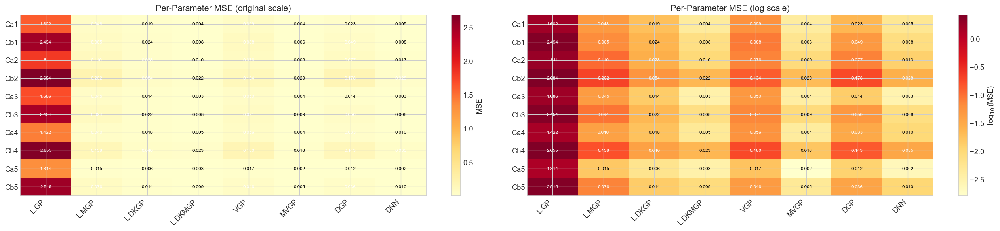

In [6]:
# ── Heatmap: Per-parameter MSE (original scale) ──
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(22, 5))

data_vals = param_mse_table.values.astype(float)

# Original scale
im1 = ax1.imshow(data_vals, aspect='auto', cmap='YlOrRd')
ax1.set_yticks(range(N_PARAMS)); ax1.set_yticklabels(PARAM_LABELS_PLAIN)
ax1.set_xticks(range(len(MODEL_ORDER))); ax1.set_xticklabels(MODEL_ORDER, rotation=45, ha='right')
for i in range(N_PARAMS):
    for j in range(len(MODEL_ORDER)):
        v = data_vals[i, j]
        ax1.text(j, i, f'{v:.3f}', ha='center', va='center', fontsize=7,
                 color='white' if v > np.median(data_vals) else 'black')
plt.colorbar(im1, ax=ax1, label='MSE'); ax1.set_title('Per-Parameter MSE (original scale)')

# Log scale
log_vals = np.log10(data_vals + 1e-8)
im2 = ax2.imshow(log_vals, aspect='auto', cmap='YlOrRd')
ax2.set_yticks(range(N_PARAMS)); ax2.set_yticklabels(PARAM_LABELS_PLAIN)
ax2.set_xticks(range(len(MODEL_ORDER))); ax2.set_xticklabels(MODEL_ORDER, rotation=45, ha='right')
for i in range(N_PARAMS):
    for j in range(len(MODEL_ORDER)):
        v = data_vals[i, j]
        ax2.text(j, i, f'{v:.3f}', ha='center', va='center', fontsize=7,
                 color='white' if log_vals[i,j] > np.median(log_vals) else 'black')
plt.colorbar(im2, ax=ax2, label=r'$\log_{10}$(MSE)'); ax2.set_title('Per-Parameter MSE (log scale)')

fig.tight_layout()
plt.show()

### 4.1.2c Boxplot comparison — original scale & log scale

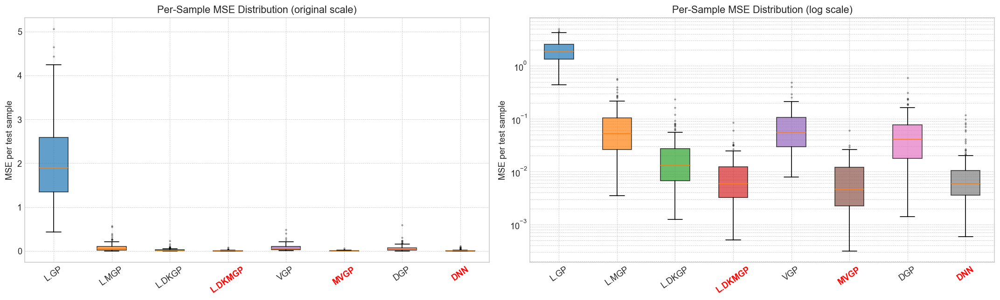

In [7]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(18, 5.5))

data_ordered = [mse_per_sample[m] for m in MODEL_ORDER]
colors = ['#1f77b4','#ff7f0e','#2ca02c','#d62728','#9467bd','#8c564b','#e377c2','#7f7f7f']

for ax, use_log, title_suffix in [(ax1, False, '(original scale)'), (ax2, True, '(log scale)')]:
    bp = ax.boxplot(data_ordered, labels=MODEL_ORDER, patch_artist=True, showfliers=True,
                    flierprops=dict(marker='.', markersize=3, alpha=0.4))
    for patch, c in zip(bp['boxes'], colors):
        patch.set_facecolor(c); patch.set_alpha(0.7)
    if use_log:
        ax.set_yscale('log')
    ax.set_ylabel('MSE per test sample')
    ax.set_title(f'Per-Sample MSE Distribution {title_suffix}')
    ax.tick_params(axis='x', rotation=35)
    ax.grid(True, which='both', ls='--', lw=0.5)
    # Highlight top 3 labels
    for tick_label in ax.get_xticklabels():
        if tick_label.get_text() in top3_models:
            tick_label.set_fontweight('bold')
            tick_label.set_color('red')

fig.tight_layout()
plt.show()

### 4.1.2d Statistical Testing: Single-output vs Multi-output

For each natural single/multi-output pair we perform a **Wilcoxon signed-rank test** 
(one-sided: $H_1$: multi-output has lower MSE) on per-sample MSE values. 
Corrections are applied via **Holm-Bonferroni** for multiple comparisons.

In [8]:
# ── Paired comparisons ──
paired = [
    ('L.GP',   'L.MGP'),
    ('L.DKGP', 'L.DKMGP'),
    ('VGP',    'MVGP'),
]

test_records = []
raw_pvals = []
for single, multi in paired:
    diff = mse_per_sample[single] - mse_per_sample[multi]
    w_stat, w_p = wilcoxon(diff, alternative='greater')
    t_stat, t_p2 = stats.ttest_rel(mse_per_sample[single], mse_per_sample[multi])
    t_p1 = t_p2 / 2 if t_stat > 0 else 1 - t_p2 / 2
    d = np.mean(diff) / (np.std(diff, ddof=1) + 1e-12)
    raw_pvals.append(w_p)
    test_records.append({
        'Single': single, 'Multi': multi,
        'MSE_S': np.mean(mse_per_sample[single]),
        'MSE_M': np.mean(mse_per_sample[multi]),
        'ΔMSE': np.mean(diff),
        "Cohen's d": d,
        'Wilcoxon p': w_p,
        'Paired-t p': t_p1,
    })

# Holm-Bonferroni correction
sorted_idx = np.argsort(raw_pvals)
n_comp = len(raw_pvals)
corrected = np.ones(n_comp)
for rank, idx in enumerate(sorted_idx):
    corrected[idx] = min(raw_pvals[idx] * (n_comp - rank), 1.0)
for rank in range(1, n_comp):
    corrected[sorted_idx[rank]] = max(corrected[sorted_idx[rank]], corrected[sorted_idx[rank-1]])

for i, rec in enumerate(test_records):
    rec['Wilcoxon p (Holm)'] = corrected[i]

pair_df = pd.DataFrame(test_records)
print('Table 3: Paired Statistical Tests — Single-output vs Multi-output')
print('='*100)
print(pair_df.to_string(index=False, float_format='%.4e'))
print()
n_sig = (pair_df['Wilcoxon p (Holm)'] < 0.05).sum()
print(f'Number of pairs significant at α=0.05 after Holm-Bonferroni: {n_sig}/{n_comp}')

Table 3: Paired Statistical Tests — Single-output vs Multi-output
Single   Multi      MSE_S      MSE_M       ΔMSE  Cohen's d  Wilcoxon p  Paired-t p  Wilcoxon p (Holm)
  L.GP   L.MGP 2.0639e+00 8.5269e-02 1.9786e+00 2.0174e+00  9.8598e-22  3.0660e-44         2.9579e-21
L.DKGP L.DKMGP 2.3872e-02 9.5566e-03 1.4315e-02 4.5116e-01  1.0200e-09  1.2776e-06         1.0200e-09
   VGP    MVGP 7.7538e-02 7.9560e-03 6.9582e-02 9.8137e-01  1.0111e-21  1.5001e-19         2.9579e-21

Number of pairs significant at α=0.05 after Holm-Bonferroni: 3/3


### 4.1.2e Per-parameter Wilcoxon tests (supplementary detail)

In [9]:
# ── Per-parameter Wilcoxon: single vs multi for each of the 10 params ──
per_param_tests = []
for single, multi in paired:
    for p_idx in range(N_PARAMS):
        diff_p = mse_per_param[single][:, p_idx] - mse_per_param[multi][:, p_idx]
        if np.all(diff_p == 0):
            w_p = 1.0
        else:
            _, w_p = wilcoxon(diff_p, alternative='greater')
        per_param_tests.append({
            'Pair': f'{single}→{multi}',
            'Param': PARAM_LABELS_PLAIN[p_idx],
            'p_raw': w_p
        })

pp_df = pd.DataFrame(per_param_tests)

# Holm-Bonferroni across ALL 30 tests
pvals_all = pp_df['p_raw'].values
n_all = len(pvals_all)
sorted_i = np.argsort(pvals_all)
corrected_all = np.ones(n_all)
for rank, idx in enumerate(sorted_i):
    corrected_all[idx] = min(pvals_all[idx] * (n_all - rank), 1.0)
for rank in range(1, n_all):
    corrected_all[sorted_i[rank]] = max(corrected_all[sorted_i[rank]], corrected_all[sorted_i[rank-1]])
pp_df['p_holm'] = corrected_all
pp_df['sig'] = pp_df['p_holm'].apply(lambda x: '***' if x<0.001 else '**' if x<0.01 else '*' if x<0.05 else 'n.s.')

pivot = pp_df.pivot(index='Param', columns='Pair', values='sig')
print('Table 4: Per-Parameter Significance (Holm-Bonferroni corrected)')
print(pivot.to_string())
print(f"\nTotal significant at α=0.05: {(pp_df['p_holm']<0.05).sum()}/{n_all}")

Table 4: Per-Parameter Significance (Holm-Bonferroni corrected)
Pair  L.DKGP→L.DKMGP L.GP→L.MGP VGP→MVGP
Param                                   
Ca1               **        ***      ***
Ca2               **        ***      ***
Ca3              ***        ***      ***
Ca4              ***        ***      ***
Ca5              ***        ***      ***
Cb1              ***        ***      ***
Cb2                *        ***      ***
Cb3                *        ***      ***
Cb4              ***        ***      ***
Cb5                *        ***      ***

Total significant at α=0.05: 30/30


### 4.1.2f Friedman test (global non-parametric comparison)

In [10]:
model_names_ordered = MODEL_ORDER
friedman_stat, friedman_p = stats.friedmanchisquare(
    *[mse_per_sample[m] for m in model_names_ordered]
)
print(f'Friedman test across all {len(model_names_ordered)} models:')
print(f'  χ² = {friedman_stat:.2f},  p = {friedman_p:.2e}')
if friedman_p < 0.05:
    print('  → Significant differences exist among models.')

Friedman test across all 8 models:
  χ² = 609.24,  p = 2.49e-127
  → Significant differences exist among models.


### 4.1.2g Paired difference visualisation

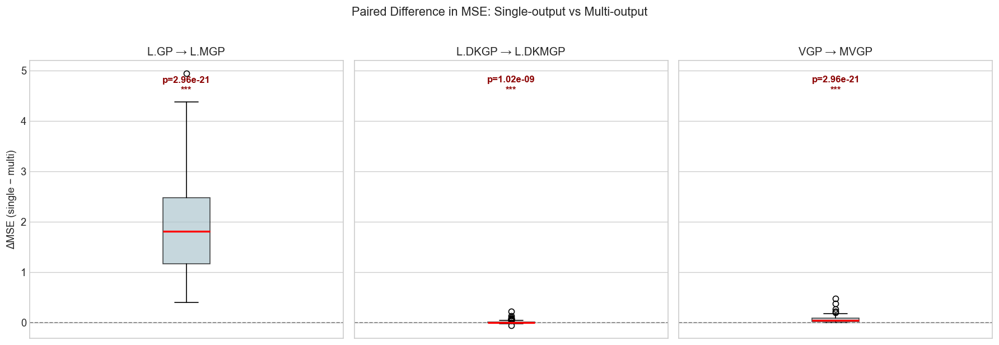

In [11]:
fig, axes = plt.subplots(1, len(paired), figsize=(5*len(paired), 5), sharey=True)
if len(paired) == 1:
    axes = [axes]

for ax, (single, multi) in zip(axes, paired):
    diff = mse_per_sample[single] - mse_per_sample[multi]
    bp = ax.boxplot(diff, vert=True, patch_artist=True,
                    boxprops=dict(facecolor='#AEC6CF', alpha=0.7),
                    medianprops=dict(color='red', linewidth=2))
    ax.axhline(0, color='gray', ls='--', lw=1)
    ax.set_title(f'{single} → {multi}', fontsize=12)
    ax.set_ylabel('ΔMSE (single − multi)' if ax == axes[0] else '')
    ax.set_xticks([])
    row = pair_df[(pair_df['Single']==single) & (pair_df['Multi']==multi)].iloc[0]
    p_val = row['Wilcoxon p (Holm)']
    sig = '***' if p_val<0.001 else '**' if p_val<0.01 else '*' if p_val<0.05 else 'n.s.'
    ax.text(1, ax.get_ylim()[1]*0.88, f'p={p_val:.2e}\n{sig}',
            ha='center', fontsize=10, color='darkred', fontweight='bold')

fig.suptitle('Paired Difference in MSE: Single-output vs Multi-output', fontsize=13, y=1.02)
plt.tight_layout()
plt.show()

## 4.1.3 Model Ranking and Selection

In [12]:
# ── Output-space MSE (PCA predictions vs Y_test_21) ──
output_mse = {}
for name in MODEL_ORDER:
    output_mse[name] = np.mean((est_preds[name] - Y_test_21)**2)

# Build ranking table in canonical order, mark top 3
print('Table 5: Final Model Ranking (canonical order, ** = top 3 by Param MSE)')
print('='*72)
print(f'{"Model":>10s}  {"Param MSE ± SE":>22s}  {"Output MSE":>12s}  {"Rank":>5s}')
print('-'*72)

# Rank values
mean_mses = {m: np.mean(mse_per_sample[m]) for m in MODEL_ORDER}
rank_vals = pd.Series(mean_mses).rank().astype(int)
top3_final = sorted(mean_mses, key=mean_mses.get)[:3]

for name in MODEL_ORDER:
    m_val = mean_mses[name]
    se_val = np.std(mse_per_sample[name], ddof=1) / np.sqrt(N_TEST)
    o_val = output_mse[name]
    r = rank_vals[name]
    marker = ' **' if name in top3_final else ''
    print(f'{name:>10s}  {m_val:>10.4f} ± {se_val:<8.4f}  {o_val:>12.6f}  {r:>5d}{marker}')
print('='*72)
print()
print('Selected for Stage 2 (UQ analysis): MVGP, L.DKMGP, DNN')
print('Rationale: top-performing multi-output GP (MVGP), competitive deep-kernel')
print('multi-output (L.DKMGP), and the neural-network baseline (DNN).')

Table 5: Final Model Ranking (canonical order, ** = top 3 by Param MSE)
     Model          Param MSE ± SE    Output MSE   Rank
------------------------------------------------------------------------
      L.GP      2.0639 ± 0.0909        0.003194      8
     L.MGP      0.0853 ± 0.0089        0.009780      7
    L.DKGP      0.0239 ± 0.0029        0.005025      4
   L.DKMGP      0.0096 ± 0.0010        0.001409      2 **
       VGP      0.0775 ± 0.0066        0.024445      6
      MVGP      0.0080 ± 0.0008        0.000643      1 **
       DGP      0.0615 ± 0.0069        0.004502      5
       DNN      0.0122 ± 0.0018        0.003068      3 **

Selected for Stage 2 (UQ analysis): MVGP, L.DKMGP, DNN
Rationale: top-performing multi-output GP (MVGP), competitive deep-kernel
multi-output (L.DKMGP), and the neural-network baseline (DNN).


---
# Section 4.2: Uncertainty Quantification and Parameter Identifiability

## 4.2.0 Load MCMC Posterior Samples for Three Candidate Models

In [13]:
def load_mcmc_posteriors(folder, n_samples, n_posterior, n_dims=10):
    all_post = np.zeros((n_samples, n_posterior, n_dims))
    for i in range(n_samples):
        fpath = os.path.join(folder, f'result_{i+1}.pkl')
        if not os.path.exists(fpath):
            print(f'  Warning: {fpath} not found')
            continue
        with open(fpath, 'rb') as f:
            d = pickle.load(f)
        mat = [d[f'param_{dim}'].detach().cpu().numpy() for dim in range(n_dims)]
        all_post[i] = np.column_stack(mat)
    print(f'  Loaded {folder}: shape {all_post.shape}')
    return all_post

# ── MCMC configuration (order: MVGP, L.DKMGP, DNN for UQ section) ──
UQ_ORDER = ['MVGP', 'L.DKMGP', 'DNN']

mcmc_config = {
    'MVGP':    {'folder': 'PlotData/MVGP_21_mcmc_result',    'n_samples': 120, 'n_posterior': 1200,
                'chains': 2, 'per_chain': 600, 'warmup': 300},
    'L.DKMGP': {'folder': 'PlotData/L.DKMGP_21_mcmc_result', 'n_samples': 120, 'n_posterior': 1500,
                'chains': 2, 'per_chain': 750, 'warmup': 300},
    'DNN':     {'folder': 'PlotData/DNN_21_mcmc_result',      'n_samples': 120, 'n_posterior': 1200,
                'chains': 2, 'per_chain': 600, 'warmup': 300},
}

posteriors = {}
for model in UQ_ORDER:
    cfg = mcmc_config[model]
    posteriors[model] = load_mcmc_posteriors(
        cfg['folder'], cfg['n_samples'], cfg['n_posterior'])

N_MCMC_SAMPLES = min(120, N_TEST)
true_params = X_test[:N_MCMC_SAMPLES]
for model in posteriors:
    posteriors[model] = posteriors[model][:N_MCMC_SAMPLES]
print(f'\nUsing {N_MCMC_SAMPLES} test samples for UQ analysis.')

  Loaded PlotData/MVGP_21_mcmc_result: shape (120, 1200, 10)
  Loaded PlotData/L.DKMGP_21_mcmc_result: shape (120, 1500, 10)
  Loaded PlotData/DNN_21_mcmc_result: shape (120, 1200, 10)

Using 120 test samples for UQ analysis.


## 4.2.1 MCMC Diagnostics

Each posterior file contains two chains concatenated (warm-up already removed). We split 
them back to compute the Gelman-Rubin $\hat{R}$ statistic and effective sample size (ESS).

In [14]:
def compute_diagnostics(posteriors_3d, model_name, per_chain_len):
    n_samples, _, n_dims = posteriors_3d.shape
    records = []
    for i in range(n_samples):
        for d in range(n_dims):
            full = posteriors_3d[i, :, d]
            chain1 = torch.tensor(full[:per_chain_len], dtype=torch.float32)
            chain2 = torch.tensor(full[per_chain_len:2*per_chain_len], dtype=torch.float32)
            chains = torch.stack([chain1, chain2], dim=0)
            rhat = float(gelman_rubin(chains, chain_dim=0, sample_dim=1))
            s_rhat = float(split_gelman_rubin(chains, chain_dim=0, sample_dim=1))
            ess_val = float(effective_sample_size(chains, chain_dim=0, sample_dim=1))
            records.append({
                'model': model_name, 'sample': i, 'param_idx': d,
                'param': PARAM_LABELS_PLAIN[d],
                'Rhat': rhat, 'split_Rhat': s_rhat, 'ESS': ess_val
            })
    return pd.DataFrame(records)

print('Computing MCMC diagnostics (this may take a few minutes)...')
diag_dfs = []
for model in UQ_ORDER:
    cfg = mcmc_config[model]
    df = compute_diagnostics(posteriors[model], model, cfg['per_chain'])
    diag_dfs.append(df)
    print(f'  {model} done.')

diag_all = pd.concat(diag_dfs, ignore_index=True)
print('Done.')

Computing MCMC diagnostics (this may take a few minutes)...
  MVGP done.
  L.DKMGP done.
  DNN done.
Done.


### 4.2.1a Diagnostics per parameter (mean and median of $\hat{R}$ and ESS)

In [15]:
print('Table 6a: MCMC Diagnostics — Per Parameter')
print('='*90)
for model in UQ_ORDER:
    sub = diag_all[diag_all['model'] == model]
    cfg = mcmc_config[model]
    print(f'\n{model}  (chains={cfg["chains"]}, per_chain={cfg["per_chain"]}, warmup={cfg["warmup"]})')
    print(f'  {"Param":>6s}  {"R̂ mean":>9s}  {"R̂ median":>10s}  {"ESS mean":>10s}  {"ESS median":>11s}')
    print('  ' + '-'*52)
    for d in range(N_PARAMS):
        p = sub[sub['param_idx'] == d]
        print(f'  {PARAM_LABELS_PLAIN[d]:>6s}  '
              f'{p["Rhat"].mean():>9.4f}  {p["Rhat"].median():>10.4f}  '
              f'{p["ESS"].mean():>10.1f}  {p["ESS"].median():>11.1f}')

Table 6a: MCMC Diagnostics — Per Parameter

MVGP  (chains=2, per_chain=600, warmup=300)
   Param    R̂ mean   R̂ median    ESS mean   ESS median
  ----------------------------------------------------
     Ca1     1.0008      0.9999       659.9        639.7
     Cb1     1.0007      0.9998       691.8        677.6
     Ca2     1.0011      1.0001       591.5        583.1
     Cb2     1.0009      0.9999       593.8        575.0
     Ca3     1.0003      0.9998       639.3        639.6
     Cb3     1.0003      0.9997       659.8        639.0
     Ca4     1.0143      0.9999       616.6        606.4
     Cb4     1.0009      0.9999       634.8        617.4
     Ca5     1.0007      1.0002       734.0        714.6
     Cb5     1.0009      0.9999       730.2        720.5

L.DKMGP  (chains=2, per_chain=750, warmup=300)
   Param    R̂ mean   R̂ median    ESS mean   ESS median
  ----------------------------------------------------
     Ca1     0.9999      0.9995      1957.0       1963.8
     Cb1     

### 4.2.1b Diagnostics per test sample (overall across 10 parameters)

In [16]:
# ── Per-sample aggregate: for each test sample, summarise across 10 params ──
print('Table 6b: MCMC Diagnostics — Per Test Sample (aggregated over 10 params)')
print('='*90)
for model in UQ_ORDER:
    sub = diag_all[diag_all['model'] == model]
    # Group by sample
    grp = sub.groupby('sample').agg(
        Rhat_mean=('Rhat', 'mean'),
        Rhat_max=('Rhat', 'max'),
        ESS_mean=('ESS', 'mean'),
        ESS_min=('ESS', 'min'),
    )
    print(f'\n{model}:')
    print(f'  Per-sample R̂_mean:  mean={grp["Rhat_mean"].mean():.4f}, '
          f'median={grp["Rhat_mean"].median():.4f}')
    print(f'  Per-sample R̂_max:   mean={grp["Rhat_max"].mean():.4f}, '
          f'median={grp["Rhat_max"].median():.4f}')
    print(f'  Per-sample ESS_mean: mean={grp["ESS_mean"].mean():.1f}, '
          f'median={grp["ESS_mean"].median():.1f}')
    print(f'  Per-sample ESS_min:  mean={grp["ESS_min"].mean():.1f}, '
          f'median={grp["ESS_min"].median():.1f}')
    n_bad = (grp['Rhat_max'] > 1.05).sum()
    print(f'  Samples with any R̂ > 1.05: {n_bad}/{len(grp)} ({100*n_bad/len(grp):.1f}%)')

Table 6b: MCMC Diagnostics — Per Test Sample (aggregated over 10 params)

MVGP:
  Per-sample R̂_mean:  mean=1.0142, median=1.0004
  Per-sample R̂_max:   mean=1.0173, median=1.0029
  Per-sample ESS_mean: mean=650.2, median=655.5
  Per-sample ESS_min:  mean=477.4, median=480.4
  Samples with any R̂ > 1.05: 1/120 (0.8%)

L.DKMGP:
  Per-sample R̂_mean:  mean=0.9999, median=0.9998
  Per-sample R̂_max:   mean=1.0016, median=1.0013
  Per-sample ESS_mean: mean=1900.9, median=1933.3
  Per-sample ESS_min:  mean=1353.5, median=1290.4
  Samples with any R̂ > 1.05: 0/120 (0.0%)

DNN:
  Per-sample R̂_mean:  mean=1.0012, median=1.0007
  Per-sample R̂_max:   mean=1.0047, median=1.0032
  Per-sample ESS_mean: mean=551.0, median=563.4
  Per-sample ESS_min:  mean=397.8, median=404.6
  Samples with any R̂ > 1.05: 0/120 (0.0%)


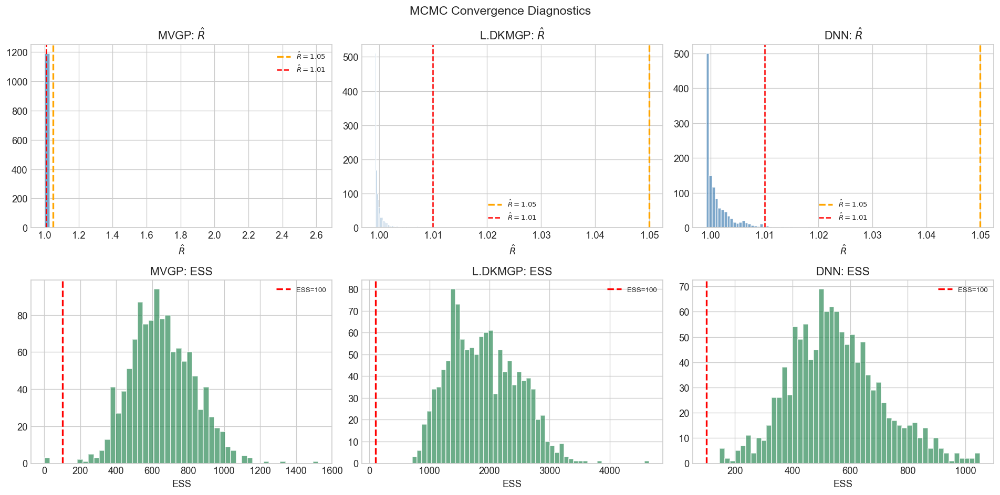

In [17]:
# ── R-hat and ESS distribution plots ──
fig, axes = plt.subplots(2, 3, figsize=(16, 8))

for col_idx, model in enumerate(UQ_ORDER):
    sub = diag_all[diag_all['model'] == model]
    
    ax = axes[0, col_idx]
    ax.hist(sub['Rhat'], bins=50, alpha=0.7, color='steelblue', edgecolor='white')
    ax.axvline(1.05, color='orange', ls='--', lw=2, label=r'$\hat{R}=1.05$')
    ax.axvline(1.01, color='red', ls='--', lw=1.5, label=r'$\hat{R}=1.01$')
    ax.set_title(f'{model}: $\hat{{R}}$')
    ax.set_xlabel(r'$\hat{R}$'); ax.legend(fontsize=8)
    
    ax = axes[1, col_idx]
    ax.hist(sub['ESS'], bins=50, alpha=0.7, color='seagreen', edgecolor='white')
    ax.axvline(100, color='red', ls='--', lw=2, label='ESS=100')
    ax.set_title(f'{model}: ESS')
    ax.set_xlabel('ESS'); ax.legend(fontsize=8)

fig.suptitle('MCMC Convergence Diagnostics', fontsize=14)
fig.tight_layout()
plt.show()

### 4.2.1c Example: Posterior Trace Plots and Distributions

We show the MCMC trace and posterior marginal for one representative test sample 
(sample index 0) across all three models for visual comparison.

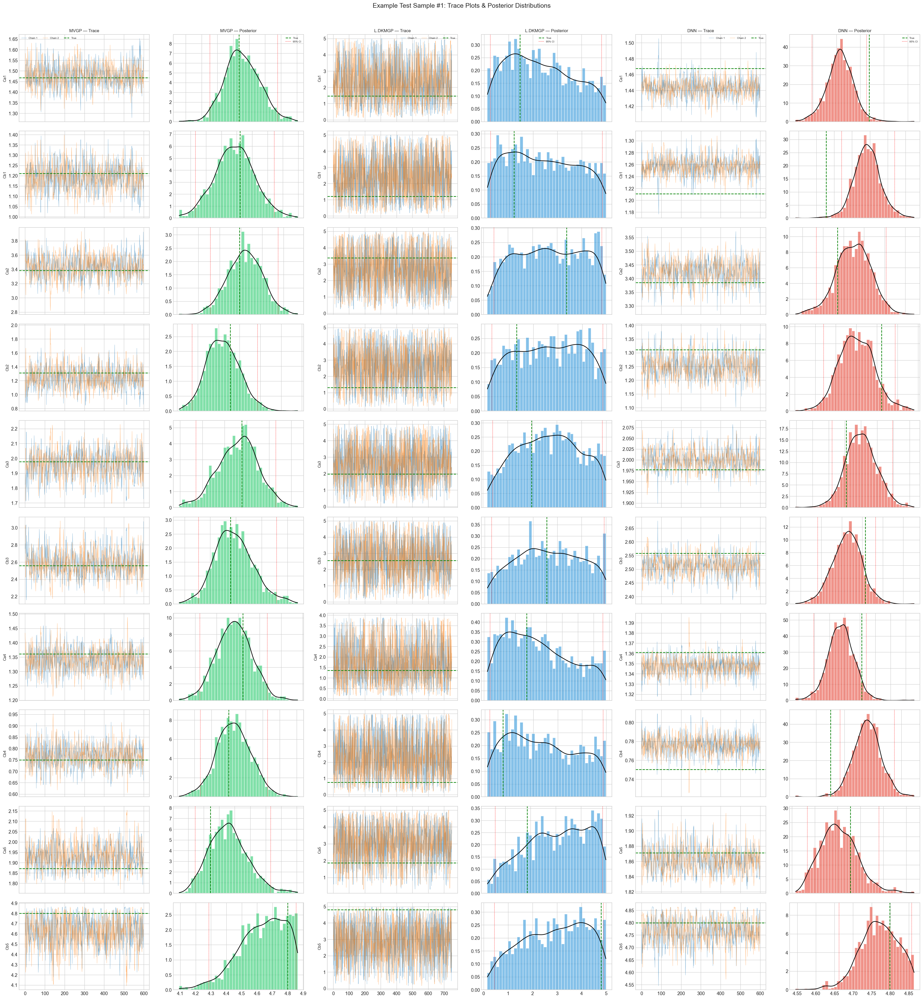

In [33]:
EXAMPLE_IDX = 1   # ← change to inspect a different test sample

def plot_example_posteriors(sample_idx):
    """
    For one test sample, plot trace + marginal posterior for all 10 params
    across the three UQ models.
    """
    fig, axes = plt.subplots(N_PARAMS, 6, figsize=(30, 3.2*N_PARAMS))
    palette = {'MVGP': '#2ecc71', 'L.DKMGP': '#3498db', 'DNN': '#e74c3c'}
    
    for d in range(N_PARAMS):
        true_val = true_params[sample_idx, d]
        
        for m_idx, model in enumerate(UQ_ORDER):
            cfg = mcmc_config[model]
            pcl = cfg['per_chain']
            full = posteriors[model][sample_idx, :, d]
            chain1 = full[:pcl]
            chain2 = full[pcl:2*pcl]
            
            # ── Trace plot ──
            ax_t = axes[d, m_idx*2]
            ax_t.plot(chain1, alpha=0.6, lw=0.5, color='C0', label='Chain 1')
            ax_t.plot(chain2, alpha=0.6, lw=0.5, color='C1', label='Chain 2')
            ax_t.axhline(true_val, color='green', ls='--', lw=1.5, label='True')
            if d == 0:
                ax_t.set_title(f'{model} — Trace', fontsize=10)
            ax_t.set_ylabel(PARAM_LABELS_PLAIN[d], fontsize=9)
            if d == 0:
                ax_t.legend(fontsize=6, ncol=3)
            if d < N_PARAMS - 1:
                ax_t.set_xticklabels([])
            
            # ── Marginal posterior ──
            ax_h = axes[d, m_idx*2 + 1]
            ax_h.hist(full, bins=40, density=True, alpha=0.6, color=palette[model], edgecolor='white')
            # KDE
            if np.std(full) > 1e-8:
                kde = gaussian_kde(full)
                xg = np.linspace(full.min(), full.max(), 200)
                ax_h.plot(xg, kde(xg), color='black', lw=1.5)
            ax_h.axvline(true_val, color='green', ls='--', lw=1.5, label='True')
            # 95% CI
            lo, hi = np.percentile(full, [2.5, 97.5])
            ax_h.axvline(lo, color='red', ls=':', lw=1)
            ax_h.axvline(hi, color='red', ls=':', lw=1, label='95% CI')
            if d == 0:
                ax_h.set_title(f'{model} — Posterior', fontsize=10)
                ax_h.legend(fontsize=6)
            if d < N_PARAMS - 1:
                ax_h.set_xticklabels([])
    
    fig.suptitle(f'Example Test Sample #{sample_idx}: Trace Plots & Posterior Distributions',
                 fontsize=15, y=1.01)
    fig.tight_layout()
    plt.show()

plot_example_posteriors(EXAMPLE_IDX)

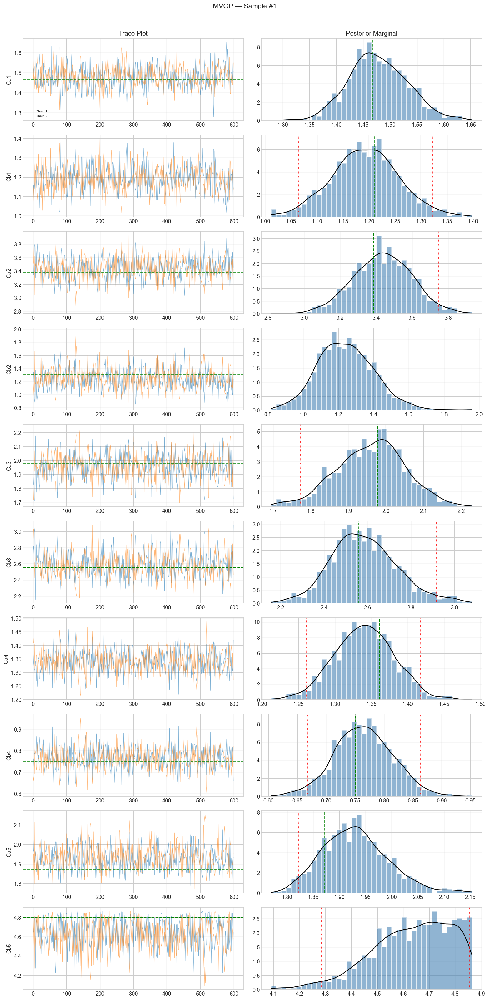

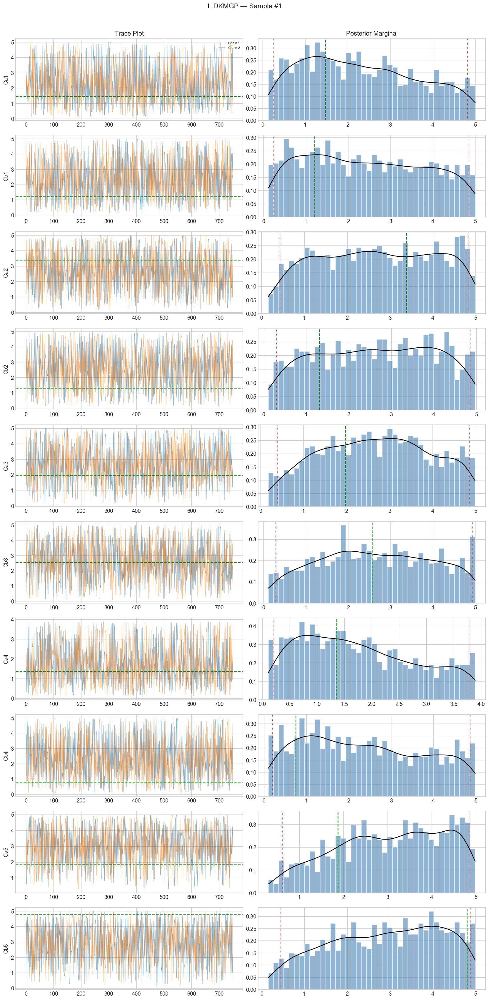

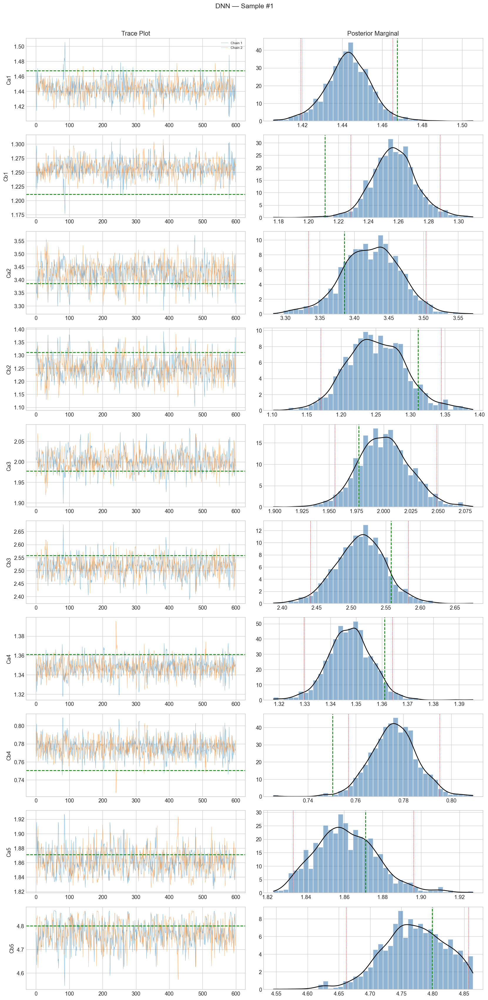

In [34]:
# ── Compact version: single model, all params (useful for appendix) ──
def plot_single_model_example(model, sample_idx):
    cfg = mcmc_config[model]
    pcl = cfg['per_chain']
    fig, axes = plt.subplots(N_PARAMS, 2, figsize=(14, 2.8*N_PARAMS))
    for d in range(N_PARAMS):
        full = posteriors[model][sample_idx, :, d]
        true_val = true_params[sample_idx, d]
        chain1 = full[:pcl]; chain2 = full[pcl:2*pcl]
        
        ax_t = axes[d, 0]
        ax_t.plot(chain1, alpha=0.6, lw=0.5, color='C0', label='Chain 1')
        ax_t.plot(chain2, alpha=0.6, lw=0.5, color='C1', label='Chain 2')
        ax_t.axhline(true_val, color='green', ls='--', lw=1.5)
        ax_t.set_ylabel(PARAM_LABELS_PLAIN[d])
        if d == 0:
            ax_t.set_title(f'Trace Plot'); ax_t.legend(fontsize=7)
        
        ax_h = axes[d, 1]
        ax_h.hist(full, bins=40, density=True, alpha=0.6, color='steelblue', edgecolor='white')
        if np.std(full) > 1e-8:
            kde = gaussian_kde(full)
            xg = np.linspace(full.min(), full.max(), 200)
            ax_h.plot(xg, kde(xg), 'k-', lw=1.5)
        ax_h.axvline(true_val, color='green', ls='--', lw=1.5)
        lo, hi = np.percentile(full, [2.5, 97.5])
        ax_h.axvline(lo, color='red', ls=':', lw=1)
        ax_h.axvline(hi, color='red', ls=':', lw=1)
        if d == 0:
            ax_h.set_title('Posterior Marginal')
    
    fig.suptitle(f'{model} — Sample #{sample_idx}', fontsize=14, y=1.01)
    fig.tight_layout()
    plt.show()

for model in UQ_ORDER:
    plot_single_model_example(model, EXAMPLE_IDX)

## 4.2.2 Calibration Assessment

We compute **marginal coverage probability** at the 95% nominal level. 
Monte Carlo SE: $\text{SE} = \sqrt{0.95 \times 0.05 / N}$.  
Results are shown both per-parameter and per-sample (overall).

In [20]:
coverage_results = {}   # {model: (N_PARAMS,)}
coverage_detail = {}    # {model: (N_MCMC_SAMPLES, N_PARAMS)} boolean

for model in UQ_ORDER:
    post = posteriors[model]
    lower = np.percentile(post, 2.5, axis=1)
    upper = np.percentile(post, 97.5, axis=1)
    covered = (true_params >= lower) & (true_params <= upper)
    coverage_detail[model] = covered
    coverage_results[model] = np.mean(covered, axis=0)

mc_se = np.sqrt(0.95 * 0.05 / N_MCMC_SAMPLES)

# ── Per-parameter table ──
cov_df = pd.DataFrame({m: coverage_results[m] for m in UQ_ORDER}, index=PARAM_LABELS_PLAIN)
print(f'Table 7a: Marginal Coverage per Parameter (nominal=0.95, MC SE={mc_se:.4f})')
print(f'  Statistically indistinguishable range: [{0.95-1.96*mc_se:.3f}, {0.95+1.96*mc_se:.3f}]')
print('='*55)
print(cov_df.to_string(float_format='%.3f'))
print()

# ── Per-sample overall: fraction of 10 params covered ──
print('Table 7b: Per-Sample Coverage (fraction of 10 params within 95% CI)')
print('-'*55)
for model in UQ_ORDER:
    per_sample_cov = np.mean(coverage_detail[model], axis=1)  # (N_MCMC_SAMPLES,)
    print(f'  {model:10s}: mean={per_sample_cov.mean():.3f}, '
          f'median={np.median(per_sample_cov):.3f}, '
          f'std={per_sample_cov.std():.3f}')
print()

# ── Summary ──
print('Overall average coverage:')
for model in UQ_ORDER:
    avg_cov = np.mean(coverage_results[model])
    n_under = np.sum(coverage_results[model] < 0.95 - 1.96*mc_se)
    n_over  = np.sum(coverage_results[model] > 0.95 + 1.96*mc_se)
    print(f'  {model:10s}: {avg_cov:.3f}  (under: {n_under}/{N_PARAMS}, over: {n_over}/{N_PARAMS})')

Table 7a: Marginal Coverage per Parameter (nominal=0.95, MC SE=0.0199)
  Statistically indistinguishable range: [0.911, 0.989]
     MVGP  L.DKMGP   DNN
Ca1 0.967    0.967 0.783
Cb1 0.958    0.950 0.867
Ca2 0.975    0.975 0.908
Cb2 0.967    0.958 0.908
Ca3 0.975    0.983 0.883
Cb3 0.967    0.958 0.900
Ca4 0.975    0.983 0.875
Cb4 0.933    0.958 0.858
Ca5 0.958    0.975 0.900
Cb5 0.958    0.950 0.925

Table 7b: Per-Sample Coverage (fraction of 10 params within 95% CI)
-------------------------------------------------------
  MVGP      : mean=0.963, median=1.000, std=0.111
  L.DKMGP   : mean=0.966, median=1.000, std=0.061
  DNN       : mean=0.881, median=0.900, std=0.132

Overall average coverage:
  MVGP      : 0.963  (under: 0/10, over: 0/10)
  L.DKMGP   : 0.966  (under: 0/10, over: 0/10)
  DNN       : 0.881  (under: 9/10, over: 0/10)


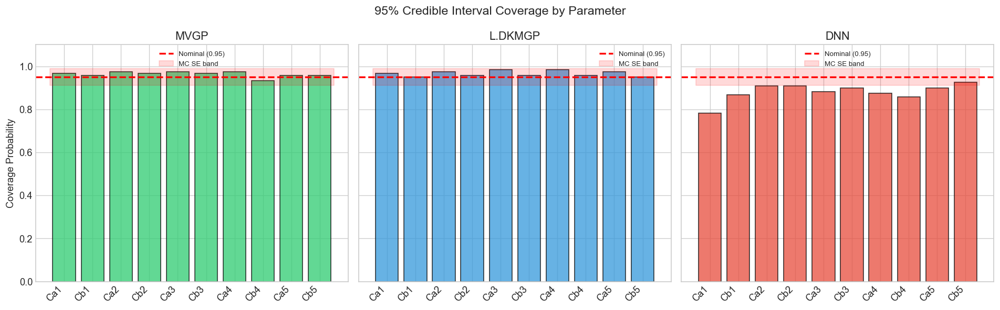

In [21]:
# ── Coverage bar plot ──
fig, axes = plt.subplots(1, 3, figsize=(16, 5), sharey=True)
x_pos = np.arange(N_PARAMS)
palette = {'MVGP': '#2ecc71', 'L.DKMGP': '#3498db', 'DNN': '#e74c3c'}

for ax, model in zip(axes, UQ_ORDER):
    bars = ax.bar(x_pos, coverage_results[model], color=palette[model], alpha=0.75, edgecolor='black')
    ax.axhline(0.95, color='red', ls='--', lw=2, label='Nominal (0.95)')
    ax.fill_between([-0.5, N_PARAMS-0.5], 0.95-1.96*mc_se, 0.95+1.96*mc_se,
                    alpha=0.15, color='red', label='MC SE band')
    ax.set_xticks(x_pos)
    ax.set_xticklabels(PARAM_LABELS_PLAIN, rotation=45, ha='right')
    ax.set_ylim(0, 1.1)
    ax.set_title(model)
    ax.legend(fontsize=8)
    if ax == axes[0]:
        ax.set_ylabel('Coverage Probability')

fig.suptitle('95% Credible Interval Coverage by Parameter', fontsize=14)
fig.tight_layout()
plt.show()

### Joint coverage

In [22]:
print('Joint coverage (all 10 parameters simultaneously in their 95% CI):')
for model in UQ_ORDER:
    joint = np.all(coverage_detail[model], axis=1)
    jc = np.mean(joint)
    jc_se = np.sqrt(jc * (1-jc) / N_MCMC_SAMPLES)
    print(f'  {model:10s}: {jc:.3f} ± {jc_se:.3f}')

Joint coverage (all 10 parameters simultaneously in their 95% CI):
  MVGP      : 0.800 ± 0.037
  L.DKMGP   : 0.725 ± 0.041
  DNN       : 0.417 ± 0.045


## 4.2.3 Predictive Performance: CRPS Analysis

CRPS via energy score formula, with Hersbach (2000) decomposition into 
**Reliability** (calibration error) and **Sharpness** (potential CRPS).

In [23]:
def compute_crps_energy(samples, truth):
    term1 = np.mean(np.abs(samples - truth))
    term2 = np.mean(np.abs(samples[:, None] - samples[None, :]))
    return term1 - 0.5 * term2

def decompose_crps_hersbach(samples, truth):
    S = len(samples)
    sorted_s = np.sort(samples)
    reliability = 0.0
    potential = 0.0
    for i in range(S + 1):
        alpha_i = i / S
        if i == 0:
            g_i = max(sorted_s[0] - truth, 0) if truth < sorted_s[0] else 0
        elif i == S:
            g_i = max(truth - sorted_s[-1], 0) if truth > sorted_s[-1] else 0
        else:
            g_i = sorted_s[i] - sorted_s[i-1]
        
        if i == 0:
            o_i = 1.0 if truth < sorted_s[0] else 0.0
        elif i == S:
            o_i = 0.0 if truth > sorted_s[-1] else 1.0
        else:
            o_i = 1.0 if truth < sorted_s[i-1] else (0.0 if truth >= sorted_s[i] else 0.5)
        
        reliability += g_i * (o_i - alpha_i)**2
        potential += g_i * alpha_i * (1 - alpha_i)
    return reliability + potential, reliability, potential

# ── Compute ──
crps_all = {};  reli_all = {};  sharp_all = {}

print('Computing CRPS and Hersbach decomposition...')
for model in UQ_ORDER:
    post = posteriors[model]
    crps_arr = np.zeros((N_MCMC_SAMPLES, N_PARAMS))
    reli_arr = np.zeros_like(crps_arr)
    sharp_arr = np.zeros_like(crps_arr)
    for i in range(N_MCMC_SAMPLES):
        for d in range(N_PARAMS):
            s = post[i, :, d]; t = true_params[i, d]
            crps_arr[i, d] = compute_crps_energy(s, t)
            _, r, p = decompose_crps_hersbach(s, t)
            reli_arr[i, d] = r;  sharp_arr[i, d] = p
    crps_all[model] = crps_arr
    reli_all[model] = reli_arr
    sharp_all[model] = sharp_arr
    print(f'  {model} done.')
print('Done.')

Computing CRPS and Hersbach decomposition...
  MVGP done.
  L.DKMGP done.
  DNN done.
Done.


In [24]:
# ── Table 8a: CRPS per parameter ──
print('Table 8a: Mean CRPS (± SE) per Parameter')
print('='*75)
header = f'{"Param":>6s}'
for model in UQ_ORDER:
    header += f'  {model:>20s}'
print(header)
print('-'*75)
for d in range(N_PARAMS):
    row = f'{PARAM_LABELS_PLAIN[d]:>6s}'
    for model in UQ_ORDER:
        m = np.mean(crps_all[model][:, d])
        se = np.std(crps_all[model][:, d], ddof=1) / np.sqrt(N_MCMC_SAMPLES)
        row += f'  {m:>8.4f} ± {se:.4f}'
    print(row)
print('-'*75)
row = f'{"Mean":>6s}'
for model in UQ_ORDER:
    m = np.mean(crps_all[model])
    se = np.std(np.mean(crps_all[model], axis=1), ddof=1) / np.sqrt(N_MCMC_SAMPLES)
    row += f'  {m:>8.4f} ± {se:.4f}'
print(row)
print()

# ── Table 8b: CRPS per sample (mean across 10 params) ──
print('Table 8b: Per-Sample CRPS (averaged over 10 params)')
print('-'*55)
for model in UQ_ORDER:
    per_sample_crps = np.mean(crps_all[model], axis=1)  # (N_MCMC_SAMPLES,)
    print(f'  {model:10s}: mean={per_sample_crps.mean():.4f}, '
          f'median={np.median(per_sample_crps):.4f}, '
          f'std={per_sample_crps.std():.4f}')

Table 8a: Mean CRPS (± SE) per Parameter
 Param                  MVGP               L.DKMGP                   DNN
---------------------------------------------------------------------------
   Ca1    0.0444 ± 0.0068    0.5998 ± 0.0242    0.0415 ± 0.0040
   Cb1    0.0542 ± 0.0040    0.7126 ± 0.0290    0.0563 ± 0.0048
   Ca2    0.0740 ± 0.0137    0.5922 ± 0.0237    0.0516 ± 0.0045
   Cb2    0.1069 ± 0.0164    0.7219 ± 0.0308    0.0827 ± 0.0071
   Ca3    0.0516 ± 0.0193    0.5284 ± 0.0206    0.0292 ± 0.0030
   Cb3    0.0634 ± 0.0111    0.6935 ± 0.0283    0.0462 ± 0.0045
   Ca4    0.0451 ± 0.0054    0.5057 ± 0.0203    0.0361 ± 0.0028
   Cb4    0.0952 ± 0.0149    0.7124 ± 0.0304    0.0757 ± 0.0062
   Ca5    0.0335 ± 0.0091    0.5082 ± 0.0196    0.0229 ± 0.0019
   Cb5    0.0511 ± 0.0087    0.6953 ± 0.0301    0.0392 ± 0.0039
---------------------------------------------------------------------------
  Mean    0.0619 ± 0.0103    0.6270 ± 0.0085    0.0481 ± 0.0024

Table 8b: Per-Sample CRPS (av

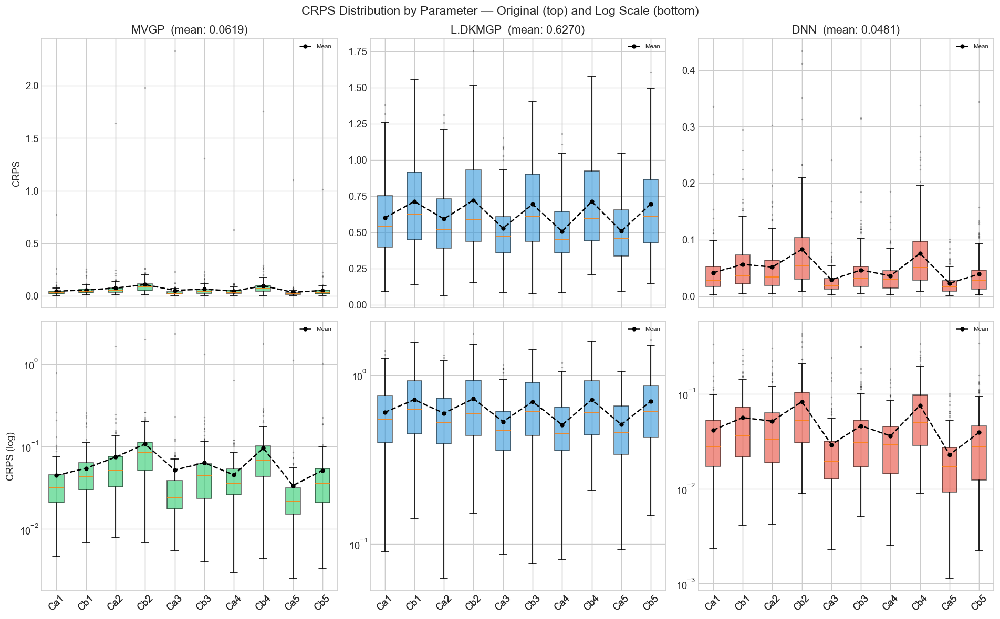

In [25]:
# ── CRPS boxplot: per-parameter (original + log scale) ──
fig, axes = plt.subplots(2, 3, figsize=(16, 10), sharex='col')

for col_idx, model in enumerate(UQ_ORDER):
    for row_idx, (use_log, suffix) in enumerate([(False, ''), (True, ' (log)')]):
        ax = axes[row_idx, col_idx]
        crps_data = crps_all[model]
        bp = ax.boxplot([crps_data[:, d] for d in range(N_PARAMS)],
                        labels=PARAM_LABELS_PLAIN, patch_artist=True,
                        boxprops=dict(facecolor=palette[model], alpha=0.6),
                        flierprops=dict(marker='.', ms=2, alpha=0.3))
        mean_vals = np.mean(crps_data, axis=0)
        ax.plot(range(1, N_PARAMS+1), mean_vals, 'k--', marker='o', ms=4, label='Mean')
        if use_log:
            ax.set_yscale('log')
        if row_idx == 0:
            ax.set_title(f'{model}  (mean: {np.mean(crps_data):.4f})')
        ax.tick_params(axis='x', rotation=45)
        ax.legend(fontsize=7)
        if col_idx == 0:
            ax.set_ylabel(f'CRPS{suffix}')

fig.suptitle('CRPS Distribution by Parameter — Original (top) and Log Scale (bottom)', fontsize=14)
fig.tight_layout()
plt.show()

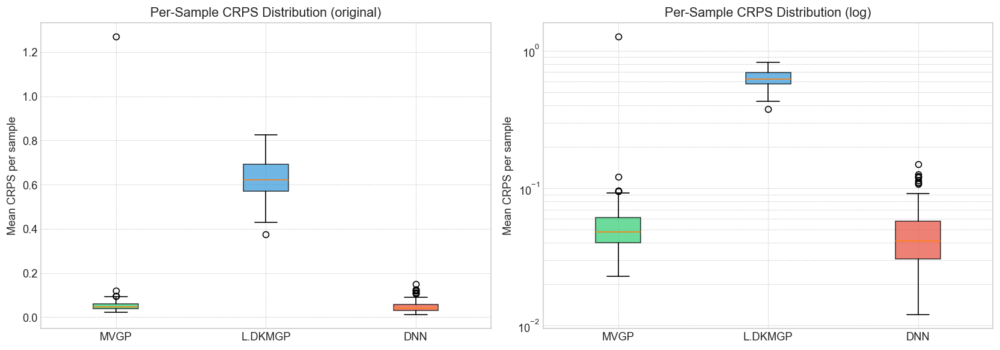

In [26]:
# ── CRPS per-sample boxplot: aggregate over 10 params (original + log) ──
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 5))

per_sample_crps_data = [np.mean(crps_all[m], axis=1) for m in UQ_ORDER]

for ax, use_log, title_suffix in [(ax1, False, '(original)'), (ax2, True, '(log)')]:
    bp = ax.boxplot(per_sample_crps_data, labels=UQ_ORDER, patch_artist=True)
    for patch, model in zip(bp['boxes'], UQ_ORDER):
        patch.set_facecolor(palette[model]); patch.set_alpha(0.7)
    if use_log:
        ax.set_yscale('log')
    ax.set_ylabel('Mean CRPS per sample')
    ax.set_title(f'Per-Sample CRPS Distribution {title_suffix}')
    ax.grid(True, which='both', ls='--', lw=0.5)

fig.tight_layout()
plt.show()

### 4.2.3a CRPS Decomposition: Reliability vs Sharpness

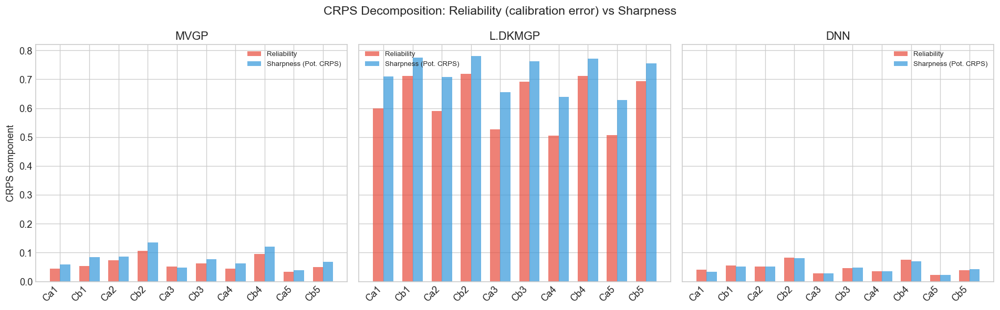

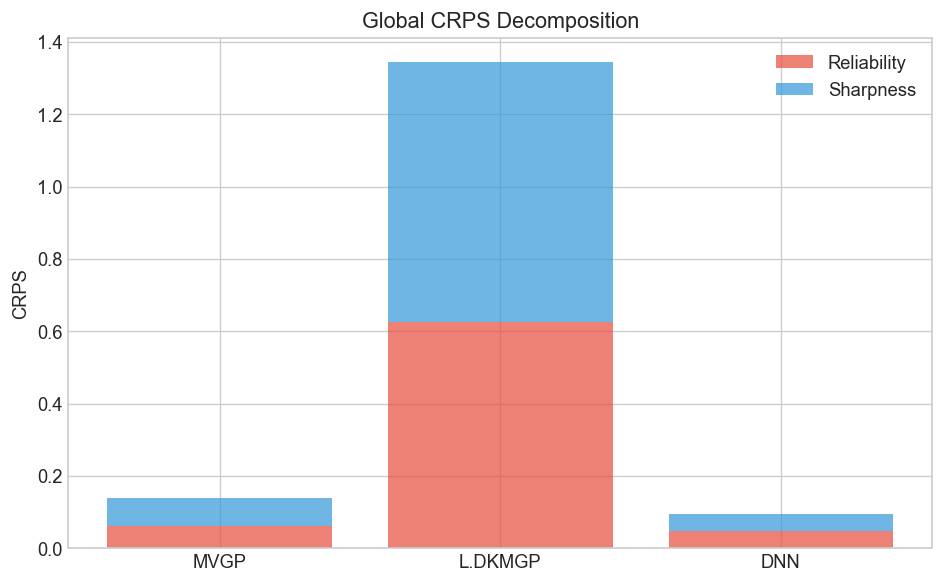


Mean Reliability / Mean Sharpness per model:
  MVGP      : reliability=0.0617, sharpness=0.0782, R/(R+S)=44.11%
  L.DKMGP   : reliability=0.6256, sharpness=0.7188, R/(R+S)=46.54%
  DNN       : reliability=0.0479, sharpness=0.0467, R/(R+S)=50.66%


In [27]:
# ── Decomposition bar plot (per parameter) ──
fig, axes = plt.subplots(1, 3, figsize=(16, 5), sharey=True)
x = np.arange(N_PARAMS)
width = 0.35

for ax, model in zip(axes, UQ_ORDER):
    mean_reli = np.mean(reli_all[model], axis=0)
    mean_sharp = np.mean(sharp_all[model], axis=0)
    ax.bar(x - width/2, mean_reli, width, label='Reliability', color='#e74c3c', alpha=0.7)
    ax.bar(x + width/2, mean_sharp, width, label='Sharpness (Pot. CRPS)', color='#3498db', alpha=0.7)
    ax.set_xticks(x)
    ax.set_xticklabels(PARAM_LABELS_PLAIN, rotation=45, ha='right')
    ax.set_title(model)
    ax.legend(fontsize=8)
    if ax == axes[0]:
        ax.set_ylabel('CRPS component')

fig.suptitle('CRPS Decomposition: Reliability (calibration error) vs Sharpness', fontsize=14)
fig.tight_layout()
plt.show()

# ── Stacked bar: per-sample aggregate ──
fig, ax = plt.subplots(figsize=(8, 5))
x = np.arange(len(UQ_ORDER))
reli_means = [np.mean(reli_all[m]) for m in UQ_ORDER]
sharp_means = [np.mean(sharp_all[m]) for m in UQ_ORDER]
ax.bar(x, reli_means, label='Reliability', color='#e74c3c', alpha=0.7)
ax.bar(x, sharp_means, bottom=reli_means, label='Sharpness', color='#3498db', alpha=0.7)
ax.set_xticks(x); ax.set_xticklabels(UQ_ORDER)
ax.set_ylabel('CRPS'); ax.set_title('Global CRPS Decomposition')
ax.legend()
fig.tight_layout()
plt.show()

print('\nMean Reliability / Mean Sharpness per model:')
for model in UQ_ORDER:
    r = np.mean(reli_all[model]); s = np.mean(sharp_all[model])
    print(f'  {model:10s}: reliability={r:.4f}, sharpness={s:.4f}, R/(R+S)={r/(r+s+1e-12):.2%}')

## 4.2.4 Posterior Contraction and Identifiability

Variance ratio: $VR_d = \text{Var}_{\text{post}}(\theta_d) / \text{Var}_{\text{prior}}(\theta_d)$.  
Prior variance estimated from Sobol training samples.

In [28]:
prior_var = np.var(X_train, axis=0)  # (N_PARAMS,)

var_ratio = {}
for model in UQ_ORDER:
    post_var = np.var(posteriors[model], axis=1)  # (N_MCMC_SAMPLES, N_PARAMS)
    var_ratio[model] = post_var / prior_var[None, :]

# ── Table 9a: per parameter ──
vr_df = pd.DataFrame({m: np.mean(var_ratio[m], axis=0) for m in UQ_ORDER}, index=PARAM_LABELS_PLAIN)
print('Table 9a: Mean Variance Ratio per Parameter (lower = better identified)')
print('='*55)
print(vr_df.to_string(float_format='%.4f'))
print()

# ── Table 9b: per sample (mean VR across 10 params) ──
print('Table 9b: Per-Sample Variance Ratio (mean across 10 params)')
print('-'*55)
for model in UQ_ORDER:
    per_sample_vr = np.mean(var_ratio[model], axis=1)
    print(f'  {model:10s}: mean={per_sample_vr.mean():.4f}, '
          f'median={np.median(per_sample_vr):.4f}')
print()

print('Identifiability summary (VR < 0.1 → well-identified, VR > 0.5 → poorly):')
for model in UQ_ORDER:
    n_good = np.sum(np.mean(var_ratio[model], axis=0) < 0.1)
    n_bad  = np.sum(np.mean(var_ratio[model], axis=0) > 0.5)
    print(f'  {model:10s}: {n_good} well-identified, {n_bad} poorly identified')

Table 9a: Mean Variance Ratio per Parameter (lower = better identified)
      MVGP  L.DKMGP    DNN
Ca1 0.0073   0.7778 0.0039
Cb1 0.0139   0.9130 0.0078
Ca2 0.0143   0.7774 0.0071
Cb2 0.0351   0.9268 0.0152
Ca3 0.0046   0.6686 0.0022
Cb3 0.0122   0.8915 0.0061
Ca4 0.0076   0.6439 0.0029
Cb4 0.0285   0.9099 0.0114
Ca5 0.0031   0.6200 0.0017
Cb5 0.0096   0.8769 0.0056

Table 9b: Per-Sample Variance Ratio (mean across 10 params)
-------------------------------------------------------
  MVGP      : mean=0.0136, median=0.0124
  L.DKMGP   : mean=0.8006, median=0.8124
  DNN       : mean=0.0064, median=0.0033

Identifiability summary (VR < 0.1 → well-identified, VR > 0.5 → poorly):
  MVGP      : 10 well-identified, 0 poorly identified
  L.DKMGP   : 0 well-identified, 10 poorly identified
  DNN       : 10 well-identified, 0 poorly identified


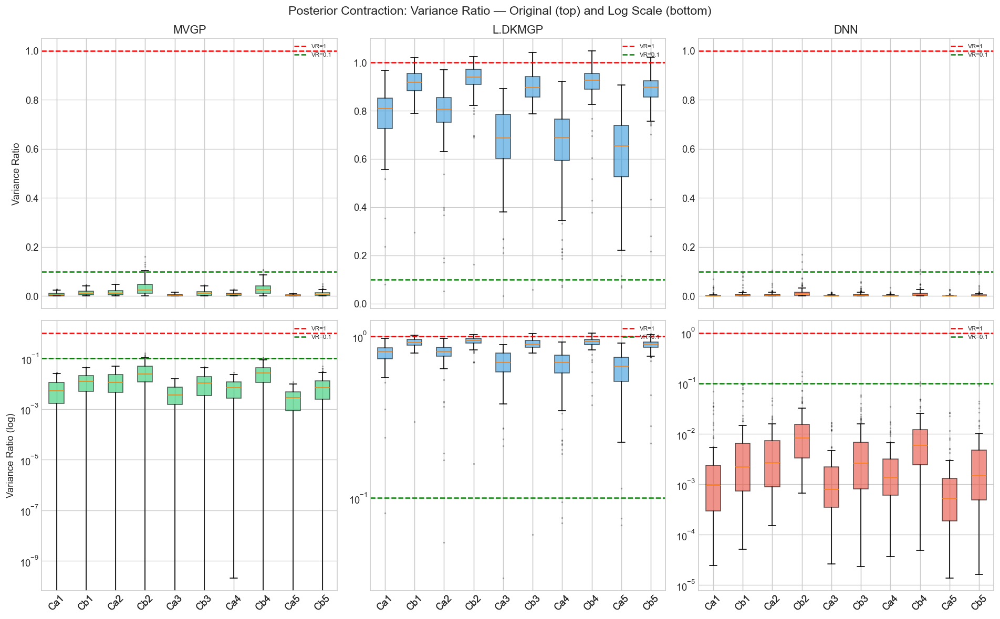

In [29]:
# ── Variance ratio boxplot: per parameter (original + log) ──
fig, axes = plt.subplots(2, 3, figsize=(16, 10), sharex='col')

for col_idx, model in enumerate(UQ_ORDER):
    data = var_ratio[model]
    for row_idx, (use_log, suffix) in enumerate([(False, ''), (True, ' (log)')]):
        ax = axes[row_idx, col_idx]
        bp = ax.boxplot([data[:, d] for d in range(N_PARAMS)],
                        labels=PARAM_LABELS_PLAIN, patch_artist=True, vert=True,
                        boxprops=dict(facecolor=palette[model], alpha=0.6),
                        flierprops=dict(marker='.', ms=2, alpha=0.3))
        ax.axhline(1.0, color='red', ls='--', lw=1.5, label='VR=1')
        ax.axhline(0.1, color='green', ls='--', lw=1.5, label='VR=0.1')
        if use_log:
            ax.set_yscale('log')
        if row_idx == 0:
            ax.set_title(model)
        ax.tick_params(axis='x', rotation=45)
        ax.legend(fontsize=7, loc='upper right')
        if col_idx == 0:
            ax.set_ylabel(f'Variance Ratio{suffix}')

fig.suptitle('Posterior Contraction: Variance Ratio — Original (top) and Log Scale (bottom)', fontsize=14)
fig.tight_layout()
plt.show()

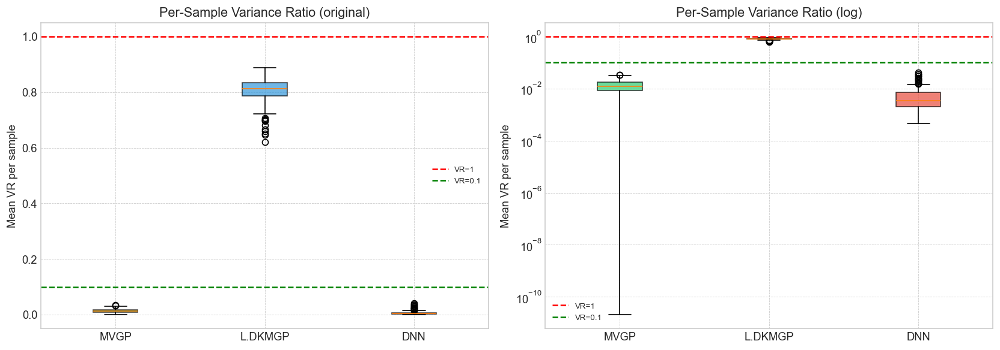

In [30]:
# ── Per-sample VR boxplot (original + log) ──
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 5))

per_sample_vr_data = [np.mean(var_ratio[m], axis=1) for m in UQ_ORDER]

for ax, use_log, suffix in [(ax1, False, '(original)'), (ax2, True, '(log)')]:
    bp = ax.boxplot(per_sample_vr_data, labels=UQ_ORDER, patch_artist=True)
    for patch, model in zip(bp['boxes'], UQ_ORDER):
        patch.set_facecolor(palette[model]); patch.set_alpha(0.7)
    ax.axhline(1.0, color='red', ls='--', lw=1.5, label='VR=1')
    ax.axhline(0.1, color='green', ls='--', lw=1.5, label='VR=0.1')
    if use_log:
        ax.set_yscale('log')
    ax.set_ylabel('Mean VR per sample')
    ax.set_title(f'Per-Sample Variance Ratio {suffix}')
    ax.legend(fontsize=8)
    ax.grid(True, which='both', ls='--', lw=0.5)

fig.tight_layout()
plt.show()

### 4.2.4a Uncertainty–error consistency (posterior std vs absolute error)

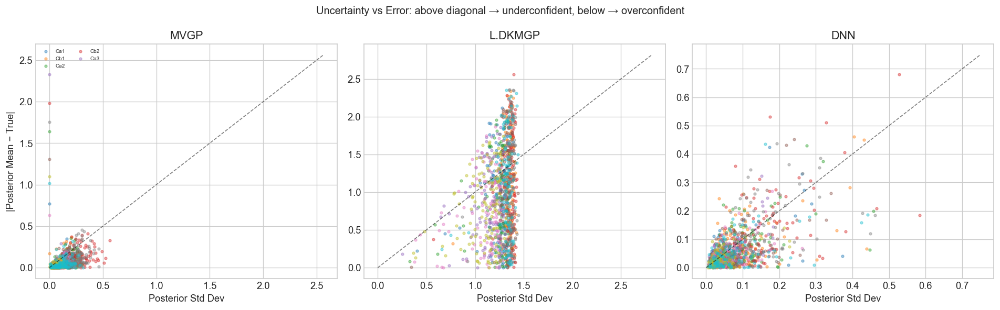

In [31]:
fig, axes = plt.subplots(1, 3, figsize=(16, 5))

for ax, model in zip(axes, UQ_ORDER):
    post_std = np.std(posteriors[model], axis=1)
    post_mean = np.mean(posteriors[model], axis=1)
    abs_err = np.abs(post_mean - true_params)
    
    for d in range(N_PARAMS):
        ax.scatter(post_std[:, d], abs_err[:, d], s=8, alpha=0.4,
                   label=PARAM_LABELS_PLAIN[d] if d < 5 else None)
    lim = max(post_std.max(), abs_err.max()) * 1.1
    ax.plot([0, lim], [0, lim], 'k--', lw=1, alpha=0.5)
    ax.set_xlabel('Posterior Std Dev')
    ax.set_title(model)
    if ax == axes[0]:
        ax.set_ylabel('|Posterior Mean − True|')
        ax.legend(fontsize=6, ncol=2, loc='upper left')

fig.suptitle('Uncertainty vs Error: above diagonal → underconfident, below → overconfident', fontsize=12)
fig.tight_layout()
plt.show()

## 4.2.5 Summary and Model Selection

In [32]:
print('Table 10: Comprehensive Model Comparison')
print('='*85)
header = f'{"Metric":>32s}'
for model in UQ_ORDER:
    header += f'  {model:>16s}'
print(header)
print('-'*85)

metrics = [
    ('Param MSE (point est.)',       lambda m: np.mean(mse_per_sample[m]) if m in mse_per_sample else np.nan, '.4f'),
    ('Mean Coverage (target 0.95)',   lambda m: np.mean(coverage_results[m]), '.3f'),
    ('Joint Coverage (10 params)',    lambda m: np.mean(np.all(coverage_detail[m], axis=1)), '.3f'),
    ('Mean CRPS',                     lambda m: np.mean(crps_all[m]), '.4f'),
    ('CRPS Reliability',              lambda m: np.mean(reli_all[m]), '.4f'),
    ('CRPS Sharpness (Pot.)',         lambda m: np.mean(sharp_all[m]), '.4f'),
    ('Mean Variance Ratio',           lambda m: np.mean(var_ratio[m]), '.4f'),
]

for name, func, fmt in metrics:
    row = f'{name:>32s}'
    for model in UQ_ORDER:
        val = func(model)
        row += f'  {val:>16{fmt}}'
    print(row)
print('='*85)

Table 10: Comprehensive Model Comparison
                          Metric              MVGP           L.DKMGP               DNN
-------------------------------------------------------------------------------------
          Param MSE (point est.)            0.0080            0.0096            0.0122
     Mean Coverage (target 0.95)             0.963             0.966             0.881
      Joint Coverage (10 params)             0.800             0.725             0.417
                       Mean CRPS            0.0619            0.6270            0.0481
                CRPS Reliability            0.0617            0.6256            0.0479
           CRPS Sharpness (Pot.)            0.0782            0.7188            0.0467
             Mean Variance Ratio            0.0136            0.8006            0.0064


### Conclusion

Based on the quantitative evidence across all metrics:

1. **MVGP** is selected as the primary emulator for subsequent analyses.
2. **L.DKMGP** and **DNN** are retained as baselines to contextualise MVGP's performance.

The CRPS decomposition reveals the nature of each model's limitations: see the Reliability 
vs Sharpness breakdown above. The variance ratio analysis identifies which constitutive 
parameters are inherently well- or poorly-identified across all emulators, informing the 
equifinality discussion in Section 4.3.

---
# END